### 1.Load TPS Function

In [198]:
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import math
import requests
import time
import pandas as pd
import random

In [199]:
import scipy
import scipy.linalg   # SciPy Linear Algebra Library

### TPS Function
Solve for matrix X of unknown weights in the linear equation system: L·X=B, where matrix L contains the control points' relationships, and B is a matrix of the control points' z-coordinates.

In [200]:
# Solve for matrix X of unknown weights in the linear equation system: L·X=B, where matrix L contains the control points' relationships, and B is a matrix of the control points' z-coordinates.
def thinPlateSpline(points, rigidity):
    t0=time.time()
    n = len(points)
    print('1',time.time())
    L = buildL(points, rigidity)  # n+3 × n+3
    print('2',time.time())
    B = buildB(points)            # n+3 × 1
    print('3',time.time())
    X = solve(L, B)               # n+3 × 1
    print('solve finished: ', time.time())
    
    weights = X[:,0] 
    #print(weights)
    a1 = weights[n + 0]
    a2 = weights[n + 1]
    a3 = weights[n + 2]
    t1=time.time()
    print('total: ',t1-t0)
    return a1,a2,a3,weights

In [201]:
# TPS kernel function.
def phi(r):
    ret = 0
    if r!=0:
        ret = r * r * math.log(r)
    return ret

In [202]:
# Returns a two-dimensional array [rows][columns] with each element initialized to 0.
def createMatrix(rows, columns):
    return np.zeros((rows, columns))

In [203]:
# Returns the square of the distance between the two specified points x0, y0 and x1, y1.
def dist2(x0, y0, x1, y1):
    dx = x0 - x1
    dy = y0 - y1
    return dx * dx + dy * dy

In [204]:
# Returns the distance between the two specified points x0, y0 and x1, y1.
def dist(x0, y0, x1, y1):
    return math.sqrt(dist2(x0, y0, x1, y1))

In [205]:
# Copies elements from the top-right to the bottom-left.
def mirrorDiagonal(M):
    for i in range(M.shape[0]):
        for j in range(i + 1, M.shape[1]):
            M[j][i] = M[i][j];
    return M;


In [206]:
# Creates the B matrix for TPS interpolation.
def buildB(points):
    B = createMatrix(len(points) + 3, 1)
    for i, point in enumerate(points):
        B[i][0] = point[2]  # z-coordinate
    return B

In [207]:
# Swap elements i and j in array a.
def swap(a, i, j):
    t = a[i]
    a[i] = a[j]
    a[j] = t

In [208]:
# Swap element i between two arrays a and b.
def swapBetween(a, b, i):
    t = a[i]
    a[i] = b[i]
    b[i] = t

In [209]:
# Returns true if matrix M is singular.
def isSingular(M):
    for i in range(min(list(M.shape))):
        if M[i][i] == 0.0:
            return True
    return False
    


In [210]:
# Creates a copy of matrix M according to the specified array of pivots.
def copyWithPivoting(M, pivots):
    A = createMatrix(M.shape[0], M.shape[1])
    for i in range(M.shape[0]):
        for j in range(M.shape[1]):
            A[i][j] = M[pivots[i]][j]

    return A

### Regular version

In [211]:
# Finds the LU decomposition for matrix M, modifying M in place.
def LUDecomposition(M):
    #print('---Original---')
    pivots = np.arange(0, M.shape[0])
    #print(M)
    #print(pivots)
    
    for k in range(M.shape[1]):
        # Find pivot p.
        p = k
        for i in range(k + 1, M.shape[0]):
            if abs(M[i][k]) > abs(M[p][k]):
                p = i
        #print(k,'---',p)
        # Exchange if necessary.
        if p != k:
            #print('before',pivots)
            for j in range(M.shape[1]):
                swapBetween(M[p], M[k], j)
            #print('after',M)
            swap(pivots, p, k)
            #print(pivots)

        # Compute multipliers and eliminate k-th column.
        if M[k][k] != 0.0:
            for i in range(k + 1, M.shape[0]):
                M[i][k] /= M[k][k]
                for j in range(k + 1, M.shape[1]):
                    M[i][j] -= M[i][k] * M[k][j]
    
    #print(pivots)
    #M.pivots = pivots
    return M,pivots


### Torch CPU version

In [212]:
import torch

def LUDecomposition_torch_cpu(M):
    #print('torch')
    #print(M)
    M = torch.tensor(M, dtype=torch.float32)
    pivots = torch.arange(0, M.shape[0])
    
    #print(pivots)
    for k in range(M.shape[1]):
        # Find pivot p.
        _, p = torch.max(torch.abs(M[k:, k]), dim=0)
        p = p.item() + k
        #print(k,'***',p)
        # Exchange if necessary.
        if p != k:
            #print('before',pivots)
            M[[p, k], :] = M[[k, p], :]
            #print(pivots[p],'---', pivots[k])
            #print('***',pivots[p],pivots[k])
            t = pivots[p].item()
            #print(t)
            pivots[p] = pivots[k]
            pivots[k] = t
            #print('===',pivots[p],pivots[k])
            #pivots[k], pivots[p] = pivots[p], pivots[k]
            #torch.swap(pivots[k], pivots[p])
            #print('after',pivots)

        # Compute multipliers and eliminate k-th column.
        if M[k, k] != 0.0:
            M[k+1:, k] /= M[k, k]
            M[k+1:, k+1:] -= torch.outer(M[k+1:, k], M[k, k+1:])
    
    #print(pivots.numpy())
    return M.numpy(), pivots.numpy()

### Torch GPU Version

In [213]:
import torch

def LUDecomposition_torch_gpu(M):
    # Check if GPU is available
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    # Convert the input matrix to a torch tensor and move it to the device
    M = torch.tensor(M, dtype=torch.float32).to(device)
    
    # Initialize pivots on the CPU
    pivots = torch.arange(0, M.shape[0])

    for k in range(M.shape[1]):
        # Find pivot p.
        _, p = torch.max(torch.abs(M[k:, k]), dim=0)
        p = p.item() + k

        # Exchange if necessary.
        if p != k:
            M[[p, k], :] = M[[k, p], :]
            t = pivots[p].item()
            pivots[p] = pivots[k]
            pivots[k] = t

        # Compute multipliers and eliminate k-th column.
        if M[k, k] != 0.0:
            M[k+1:, k] /= M[k, k]
            M[k+1:, k+1:] -= torch.outer(M[k+1:, k], M[k, k+1:])

    return M.cpu().numpy(), pivots.numpy()  # Move the result back to CPU before converting to numpy

In [214]:
# Returns matrix X such that L · X = B.
def solve(L, B):
    #print(L.shape)
    #print(B.shape)
    print('--------------------------------------------')
    if L.shape[0] != B.shape[0]:
        print ('Matrix row dimensions must agree: ' + str(L.shape[0]) + ' ' + str(B.shape[0]))
    #print(L.shape)
    Z=L.copy()
    #print(L)
    #LU,lu_pivots = LUDecomposition(L)
    #print('numpy: ',lu_pivots)
    #LU,lu_pivots = LUDecomposition_torch_cpu(Z)
    LU,lu_pivots = LUDecomposition_torch_gpu(Z)
    #print('torch: ',lu_pivots1)
    #P1, L1, U1 = lu_decomposition(L)
    print('--------------------------------------------')

    if isSingular(LU):
        print("Matrix is singular")

    X = copyWithPivoting(B, lu_pivots)
    #print('5',time.time())
    # Solve LU.L * Y = B
    for k in range(LU.shape[1]):
        for i in range(k + 1, LU.shape[1]):
            for j in range(B.shape[1]):
                X[i][j] -= X[k][j] * LU[i][k]
    #print('6',time.time())
    # Solve LU.U * X = Y
    for k in range(LU.shape[1] - 1,-1,-1):
        for j in range(B.shape[1]):
            X[k][j] /= LU[k][k]
            
        for i in range(k):
            for j in range(B.shape[1]):
                X[i][j] -= X[k][j] * LU[i][k]

    #print('X',X)
    return X


In [215]:
# ******* Confirmed ********
# Creates the L matrix for TPS interpolation.
def buildL(points, rigidity):
    n = len(points)
    L = createMatrix(n + 3, n + 3)
    a = 0  # mean of distances between control points xy-projections
    # Calculate how much each point influences all other points using radial basis function φ.
    for i in range(n):
        x = points[i][0]
        y = points[i][1]
        for j in range(i + 1,n):
            d = dist(x, y, points[j][0], points[j][1])
            L[i][j] = phi(d)
            a += d * 2
            
        L[i][n + 0] = 1.0
        L[i][n + 1] = x
        L[i][n + 2] = y
    # Set rigidity parameters on the diagonal.
    #print(L[37,:])
    a /= n * n
    
    for k in range(n):
        L[k][k] = rigidity * a**2  # λa^2
       
    # L is diagonally symmetrical, no need to recalculate the other side.
    return mirrorDiagonal(L);   

In [216]:
import torch

In [217]:
# TPS kernel function.
def phi(r):
    ret = 0
    if r!=0:
        ret = r * r * math.log(r)
    return ret

In [218]:
# Returns the distance between the two specified points x0, y0 and x1, y1.
def dist(x0, y0, x1, y1):
    dx = x0 - x1
    dy = y0 - y1
    ret = dx * dx + dy * dy
    return math.sqrt(ret)

In [219]:
def dist_gpu(x0, y0, x1, y1):
    x0_tensor = x0.clone().detach().cuda()
    y0_tensor = y0.clone().detach().cuda()
    x1_tensor = x1.clone().detach().cuda()
    y1_tensor = y1.clone().detach().cuda()

    dx = x0_tensor - x1_tensor
    dy = y0_tensor - y1_tensor
    ret = dx * dx + dy * dy

    # Transfer the result back to CPU if needed
    return torch.sqrt(ret).cpu().item() 

In [220]:
# this is way too slow
def getZ_gpu(x, y, a1, a2, a3, points, weights):
    # Convert scalar inputs to PyTorch tensors and move them to the GPU if available
    x_tensor = torch.tensor(x, dtype=torch.float32).cuda()
    y_tensor = torch.tensor(y, dtype=torch.float32).cuda()
    a1_tensor = torch.tensor(a1, dtype=torch.float32).cuda()
    a2_tensor = torch.tensor(a2, dtype=torch.float32).cuda()
    a3_tensor = torch.tensor(a3, dtype=torch.float32).cuda()
    
    # Convert lists to PyTorch tensors and move them to the GPU if available
    points_tensor = torch.tensor(points, dtype=torch.float32).cuda()
    weights_tensor = torch.tensor(weights, dtype=torch.float32).cuda()

    n = len(points)
    z = a1_tensor + a2_tensor * x_tensor + a3_tensor * y_tensor

    for i in range(n):
        point = points_tensor[i]
        z += weights_tensor[i] * phi(dist_gpu(point[0], point[1], x_tensor, y_tensor))
    print(z.item())
    return z.item()

In [221]:
def getZ(x,y,a1,a2,a3,points,weights):
    n=len(points)
    z = a1 + a2 * x + a3 * y
    for i in range(n):
        point = points[i]
        z += weights[i] * phi(dist(point[0], point[1], x, y))       
    return z

In [222]:
# Parrallel computing with joblib 
import numpy as np
from joblib import Parallel, delayed

def getColumnZ_p(x,all_ys,isLogarithmic):
    rangev = maxv - minv
    xxs =[]
    yys=[]
    zzs=[]
    ccs=[]
    
    #print(all_ys)
    #iz = getZ(x,y,a1,a2,a3,points,weights)
    # Parallelize the computation using joblib and numpy vectorized operations
    results = Parallel(n_jobs=-1)(delayed(getZ)(x,yy,a1,a2,a3,points,weights) for yy in all_ys)
    #print(results)
    # Combine the results if needed
    combined_result = np.sum(results, axis=0)

    #return x,all_ys,combined_result
    return results#combined_result

In [223]:
#normal calculation
def getColumnZ(x,all_ys,isLogarithmic):
    rangev = maxv - minv
    xxs =[]
    yys=[]
    zzs=[]
    ccs=[]
    combined_result=[]
    for yy in all_ys:
        iz = getZ(x,yy,a1,a2,a3,points,weights)
        combined_result.append(iz)
   
    return combined_result

### 2. Load AQI data from https://air.cnemc.cn:18007/
#### Data is downloaded from previous notebook

In [224]:
import requests
import time
import pandas as pd
import random

In [225]:
df_all = pd.read_csv(r'D:\Tommy\+WeatherData\+China_Geometries\++GIS_China_Data\air.cnemc.cn18007\aqi_Stationss_all_2.csv')
df_all

,TimePoint,Area,PositionName,StationCode,Latitude,Longitude,AQI,Quality,Measure,Unheathful,NO2,O3,PM10,PM2_5,SO2,NO,NOx
0,2023-12-06T23:00:00,北京市,万寿西宫,1001A,39.8784,116.3621,398,严重污染,儿童、老年人和病人应当留在室内，避免体力消耗，一般人群应避免户外活动,健康人群运动耐受力降低，有明显强烈症状，提前出现某些疾病,63,3,498,137,2,—,—
1,2023-12-06T23:00:00,北京市,定陵,1002A,40.2915,116.2202,147,轻度污染,儿童、老年人及心脏病、呼吸系统疾病患者应减少长时间、高强度的户外锻炼,易感人群症状有轻度加剧，健康人群出现刺激症状,19,21,243,76,3,—,—
2,2023-12-06T23:00:00,北京市,东四,1003A,39.9289,116.4174,411,严重污染,儿童、老年人和病人应当留在室内，避免体力消耗，一般人群应避免户外活动,健康人群运动耐受力降低，有明显强烈症状，提前出现某些疾病,59,3,511,117,3,—,—
3,2023-12-06T23:00:00,北京市,天坛,1004A,39.8863,116.4072,249,重度污染,儿童、老年人和心脏病、肺病患者应停留在室内，停止户外运动，一般人群减少户外运动,心脏病和肺病患者症状显著加剧，运动耐受力降低，健康人群普遍出现症状,56,4,384,96,4,—,—
4,2023-12-06T23:00:00,北京市,农展馆,1005A,39.9365,116.4620,360,严重污染,儿童、老年人和病人应当留在室内，避免体力消耗，一般人群应避免户外活动,健康人群运动耐受力降低，有明显强烈症状，提前出现某些疾病,62,6,468,120,2,—,—
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1720,2023-12-06T23:00:00,石河子市,艾青诗歌馆,2709A,44.2967,86.0497,97,良,极少数异常敏感人群应减少户外活动,空气质量可接受，但某些污染物可能对极少数异常敏感人群健康有较弱影响,30,9,59,72,5,—,—
1721,2023-12-06T23:00:00,石河子市,阳光学校,2710A,44.3075,86.0697,84,良,极少数异常敏感人群应减少户外活动,空气质量可接受，但某些污染物可能对极少数异常敏感人群健康有较弱影响,30,9,84,62,6,—,—
1722,2023-12-06T23:00:00,石河子市,南区管委会,3442A,44.2331,86.0470,75,良,极少数异常敏感人群应减少户外活动,空气质量可接受，但某些污染物可能对极少数异常敏感人群健康有较弱影响,24,20,60,55,7,—,—
1723,2023-12-06T23:00:00,五家渠市,农水大厦,2711A,44.1756,87.5475,—,—,—,—,—,—,—,—,—,—,—


In [226]:
df_all.rename(columns={'Latitude': 'lat','Longitude': 'lon','AQI': 'aqi'}, inplace=True)

df_final = df_all.loc[df_all['aqi']!='—']

In [227]:
df_final

,TimePoint,Area,PositionName,StationCode,lat,lon,aqi,Quality,Measure,Unheathful,NO2,O3,PM10,PM2_5,SO2,NO,NOx
0,2023-12-06T23:00:00,北京市,万寿西宫,1001A,39.8784,116.3621,398,严重污染,儿童、老年人和病人应当留在室内，避免体力消耗，一般人群应避免户外活动,健康人群运动耐受力降低，有明显强烈症状，提前出现某些疾病,63,3,498,137,2,—,—
1,2023-12-06T23:00:00,北京市,定陵,1002A,40.2915,116.2202,147,轻度污染,儿童、老年人及心脏病、呼吸系统疾病患者应减少长时间、高强度的户外锻炼,易感人群症状有轻度加剧，健康人群出现刺激症状,19,21,243,76,3,—,—
2,2023-12-06T23:00:00,北京市,东四,1003A,39.9289,116.4174,411,严重污染,儿童、老年人和病人应当留在室内，避免体力消耗，一般人群应避免户外活动,健康人群运动耐受力降低，有明显强烈症状，提前出现某些疾病,59,3,511,117,3,—,—
3,2023-12-06T23:00:00,北京市,天坛,1004A,39.8863,116.4072,249,重度污染,儿童、老年人和心脏病、肺病患者应停留在室内，停止户外运动，一般人群减少户外运动,心脏病和肺病患者症状显著加剧，运动耐受力降低，健康人群普遍出现症状,56,4,384,96,4,—,—
4,2023-12-06T23:00:00,北京市,农展馆,1005A,39.9365,116.4620,360,严重污染,儿童、老年人和病人应当留在室内，避免体力消耗，一般人群应避免户外活动,健康人群运动耐受力降低，有明显强烈症状，提前出现某些疾病,62,6,468,120,2,—,—
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1719,2023-12-06T23:00:00,阿勒泰地区,市站,2708A,47.8517,88.1264,31,优,各类人群可正常活动,空气质量令人满意，基本无空气污染,62,5,16,10,4,—,—
1720,2023-12-06T23:00:00,石河子市,艾青诗歌馆,2709A,44.2967,86.0497,97,良,极少数异常敏感人群应减少户外活动,空气质量可接受，但某些污染物可能对极少数异常敏感人群健康有较弱影响,30,9,59,72,5,—,—
1721,2023-12-06T23:00:00,石河子市,阳光学校,2710A,44.3075,86.0697,84,良,极少数异常敏感人群应减少户外活动,空气质量可接受，但某些污染物可能对极少数异常敏感人群健康有较弱影响,30,9,84,62,6,—,—
1722,2023-12-06T23:00:00,石河子市,南区管委会,3442A,44.2331,86.0470,75,良,极少数异常敏感人群应减少户外活动,空气质量可接受，但某些污染物可能对极少数异常敏感人群健康有较弱影响,24,20,60,55,7,—,—


In [228]:
xg=df_final['lon'].tolist()
yg=df_final['lat'].tolist()
zg=df_final['aqi'].tolist()
zg=list(map(int, zg))

In [229]:
# "Viridis-like" colormap with white background
from matplotlib.colors import LinearSegmentedColormap
white_viridis = LinearSegmentedColormap.from_list('white_viridis', [
        (0,'#0000ff'),
        (0.08, '#00ff00'),
        (0.16, '#ffff00'),
        (0.24, '#ff8000'),
        (0.32, '#ff0000'),
        (0.48, '#653780'),
        (0.64, '#b4b400'),
        (0.8, '#853638'),
        (0.88, '#853638'),
        (0.94, '#853638'),
        (1, '#853638')
    ], N=128)

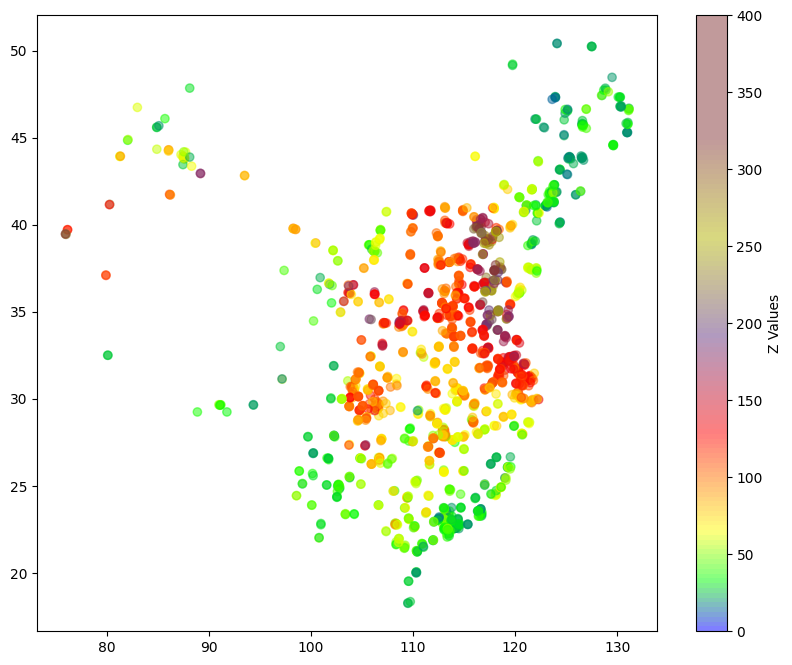

In [230]:
# Plot the points
fig = plt.figure(figsize=(10, 8))
plt.scatter(xg, yg, c=zg, cmap=white_viridis,alpha=0.5,vmax=400, vmin=0)
#plt.gca().invert_yaxis()
plt.colorbar(label='Z Values')
# Show the plot
plt.show()

In [231]:
minv=0
maxv=max(zg)
maxv

500

In [232]:
xmin = df_final['lon'].min()
xmax = df_final['lon'].max()
ymin = df_final['lat'].min()
ymax = df_final['lat'].max()
print(xmax,xmin,ymax,ymin)

131.1652 75.9483 50.4278 18.2489


### Use lat,lon directly

In [233]:
# lat/lon
scale_ratio=10
pts=[]
for i, row in df_final.iterrows():
    p=[round(row['lon'],2),round(row['lat'],2),int(row['aqi'])]
    pts.append(p)
print(pts)

[[116.36, 39.88, 398], [116.22, 40.29, 147], [116.42, 39.93, 411], [116.41, 39.89, 249], [116.46, 39.94, 360], [116.34, 39.93, 421], [116.29, 39.96, 368], [116.66, 40.13, 144], [116.63, 40.33, 166], [116.23, 40.22, 157], [116.4, 39.98, 359], [116.18, 39.91, 179], [115.97, 40.45, 91], [117.07, 40.15, 153], [116.83, 40.41, 175], [116.15, 39.82, 243], [116.68, 39.91, 372], [115.96, 39.76, 220], [116.47, 39.77, 372], [115.99, 40.46, 91], [116.62, 40.31, 169], [116.25, 39.88, 338], [116.84, 40.38, 166], [117.14, 39.17, 345], [117.24, 39.11, 169], [117.2, 39.09, 279], [117.18, 39.21, 333], [117.31, 39.09, 288], [117.71, 39.03, 269], [117.46, 38.84, 273], [117.76, 39.16, 137], [117.16, 38.92, 262], [117.79, 39.25, 228], [117.37, 38.98, 283], [117.16, 39.08, 333], [117.19, 39.11, 161], [117.21, 39.17, 270], [117.39, 39.15, 308], [117.04, 39.38, 276], [117.03, 39.06, 367], [116.96, 38.94, 266], [117.41, 40.06, 161], [117.82, 39.35, 314], [114.44, 38.04, 126], [114.61, 38.03, 119], [114.49, 38.1

In [234]:
points = np.array(pts)
minv=0.001
maxv=600
rangev = maxv-minv
rigidity= rangev * 0.05 # use 5% of range as the rigidity0.00995
rigidity=0.005 #0.02995
print(rigidity)


0.005


In [235]:
a1,a2,a3,weights = thinPlateSpline(points,rigidity)
print(a1,a2,a3,weights)
ratios = np.array([a1, a2, a3])
#np.save(r'D:\Tommy\+WeatherData\+plumlabs\thinPlateSpline_weights.npy', weights)
#np.savez(r'D:\Tommy\+WeatherData\+plumlabs\thinPlateSpline_weights_vars.npz', ratios,weights,points)
#print(a1,a2,a3)
#ret = getZ(1510,678,a1,a2,a3,points,weights)
#print(ret)

1 1701890953.6621084
2 1701890957.1316533
3 1701890957.133648
--------------------------------------------
--------------------------------------------
solve finished:  1701890962.0150266
total:  8.352918148040771
-173.89748402196295 -13.957931680368562 -4.237493114578597 [  98.55088185  -42.37836433  118.31393475 ... -173.89748402  -13.95793168
   -4.23749311]


### Populate new locations

In [242]:
LN101 = math.log(101)
t =  2 * math.pi

In [243]:
view_height=int(ymax-ymin)*10
view_width=int(xmax-xmin)*10
print(view_width,view_height)

550 320


### Test for China Region

In [287]:
#132.97047 75.85898 50.42157 18.2423
xgs = []
ygs = []
zgs = []
print('start',time.time())
t0=time.time()
for xx in np.arange(75.86,132.97,0.2):
    #t1=time.time()
    #xs,ys,zs,cs = drawColumn(xx,33.25,38.45,minv,maxv,ymin,True,0.1)
    #drawColumn(xx,33.25,38.45,minv,maxv,ymin,True,0.1)
    all_ys =np.arange(18.24,50.42,0.2)
    rets = getColumnZ_p(xx,all_ys,True)
    #print(rets)
    for k in range(len(all_ys)):
        xgs.append(xx)
        ygs.append(all_ys[k])
        zgs.append(rets[k])
    t2=time.time()
    #print(xx,'---',t2-t1)
    #xg = xg + xs
    #yg = yg + ys
    #zg = zg + zs
ts=time.time()
print('end',time.time())
print('total', ts-t0)

start 1701892737.978719
end 1701892798.3386452
total 60.35892939567566


In [288]:
print(len(xgs),len(ygs),len(zgs))

46046 46046 46046


In [283]:
# "Viridis-like" colormap with white background
from matplotlib.colors import LinearSegmentedColormap
white_viridis = LinearSegmentedColormap.from_list('white_viridis', [
        (0,'#0000ff'),
        (0.08, '#00ff00'),
        (0.16, '#ffff00'),
        (0.24, '#ff8000'),
        (0.32, '#ff0000'),
        (0.48, '#653780'),
        (0.64, '#b4b400'),
        (0.8, '#853638'),
        (0.88, '#853638'),
        (0.94, '#853638'),
        (1, '#853638')
    ], N=1024)

#### Test Color 1

In [92]:
# "Viridis-like" colormap with white background
from matplotlib.colors import LinearSegmentedColormap
china_aqi = LinearSegmentedColormap.from_list('china_aqi', [
        (0,'#00ff00'),
        (0.1, '#ffff00'),
        (0.2, '#ff7E00'),
        (0.3, '#ff0000'),
        (0.4, '#99004C'),
        (0.6, '#7E0023'),
        (1, '#7E0023')
    ], N=256)

#### Test Color 2

In [289]:
# "Viridis-like" colormap with white background
from matplotlib.colors import LinearSegmentedColormap
china_aqi = LinearSegmentedColormap.from_list('china_aqi', [
        (0,'#00ff00'),
        (0.1, '#ffff00'),
        (0.16, '#ffff00'),
        (0.3, '#ff7e00'),
        (0.4, '#ff0000'),
        (0.45, '#99004c'),
        (0.55, '#99004c'),
        (0.7, '#7e0023'),
        (1, '#7e0023')
    ], N=256)

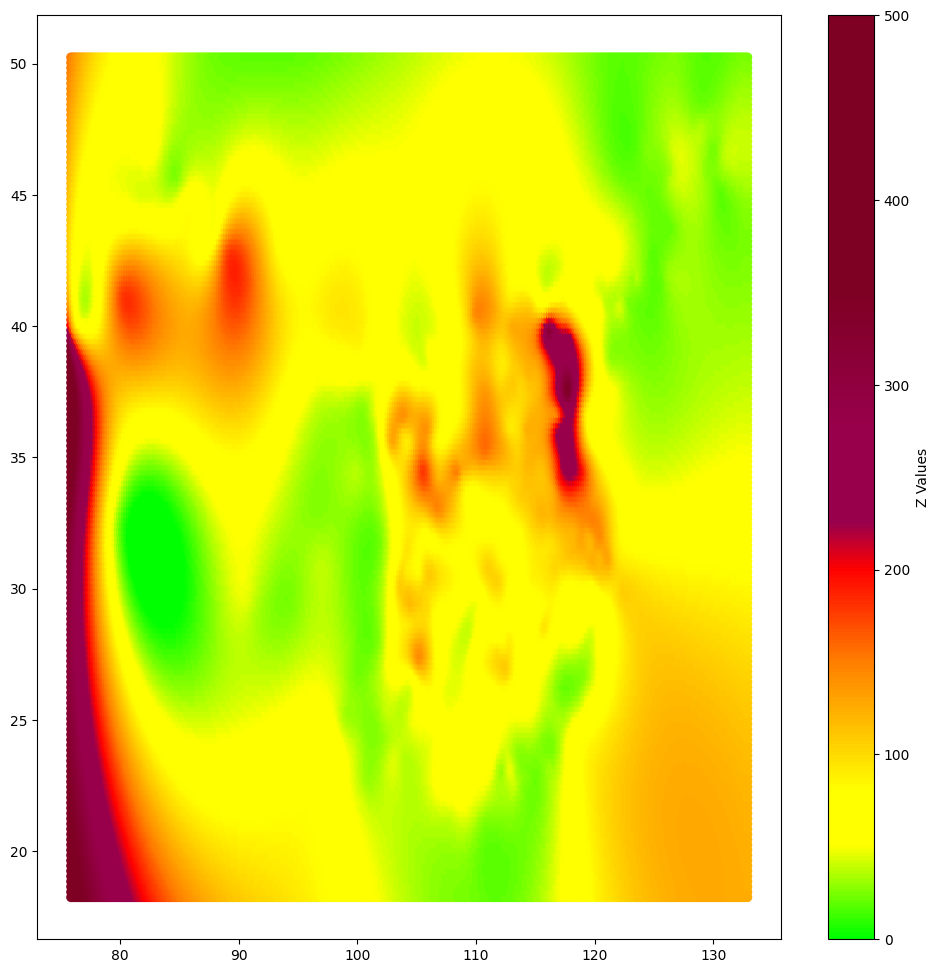

In [290]:
# Plot the points
fig = plt.figure(figsize=(12, 12))
plt.scatter(xgs, ygs, c=zgs, cmap=china_aqi,alpha=1,vmax=500, vmin=0)
#plt.scatter(xgs, ygs, c=zgs, cmap=white_viridis,alpha=1,vmax=500, vmin=0)
#plt.scatter(xgs, ygs, c=zgs, cmap='rainbow',alpha=0.5,vmax=900, vmin=0)
#plt.gca().invert_yaxis()
plt.colorbar(label='Z Values')
# Show the plot
plt.show()

### Plot AQI image with Country and State Borders

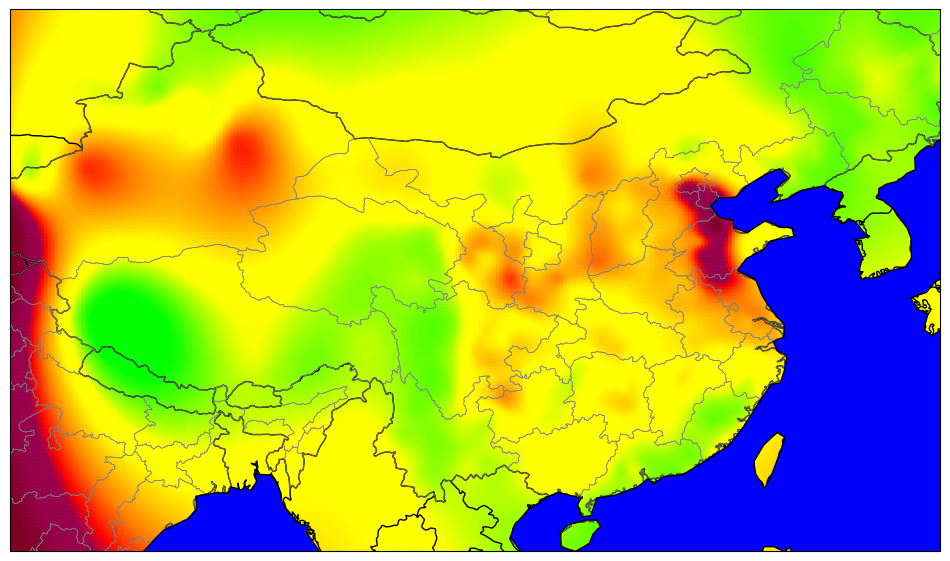

In [291]:
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.feature import NaturalEarthFeature


# Define the map projection
#proj = ccrs.Mercator()
proj = ccrs.PlateCarree()
# Plot the radar tile image
fig = plt.figure(figsize=(12, 12))
ax = fig.add_subplot(1, 1, 1, projection=proj)

# Plot the country borders

states_provinces = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_1_states_provinces_lines',
        scale='50m',
        facecolor='none')
#cfeature.BORDERS
ax.add_feature(cfeature.BORDERS, linestyle='-', linewidth=1, edgecolor='black')
ax.add_feature(cfeature.COASTLINE,linestyle='-', edgecolor='black', linewidth=1)
ax.add_feature(cfeature.STATES,linestyle='-', edgecolor='gray', linewidth=0.5)

#ax.add_feature(cfeature.STATES, linestyle='-', linewidth=1, edgecolor='gray')
#ax.imshow(grid1, extent=(xmin, xmax, ymax, ymin), cmap=white_viridis, interpolation='gaussian')
#plt.scatter(xgs, ygs, c=zgs, cmap='rainbow',alpha=0.5,vmax=500, vmin=0)
#plt.scatter(xgs, ygs, c=zgs, cmap=white_viridis,alpha=0.5,vmax=600, vmin=0)
plt.scatter(xgs, ygs, c=zgs, cmap=china_aqi,alpha=0.5,vmax=500, vmin=0)
# Plot the radar tile image on the map 
#extent is [xmin,xmax,ymin,ymax]
#ax.imshow(radar_tile, origin='upper', extent=[13775787, 14401959, 4383205, 5009377],transform=proj, alpha=0.5)
#tile 54,39
#ax.imshow(radar_tile, origin='upper', extent=[123.75, 129.374999, 36.597889,  40.979897],transform=proj, alpha=0.5)
#tile 55,38
#ax.imshow(radar_tile, origin='upper', extent=[129.374999, 134.999998, 31.952164,  36.597889],transform=proj, alpha=0.5)

# Create a NaturalEarthFeature object for the ocean
ocean = NaturalEarthFeature('physical', 'ocean', '110m', edgecolor='black', facecolor='blue')
# Add the ocean to the map
ax.add_feature(ocean)


# Set the x and y axis limits
ax.set_xlim(xmin,xmax) #[xmin,xmax]
ax.set_ylim( ymin,ymax) #[ymin, ymax]
plt.show()

- #### steps = 0.3
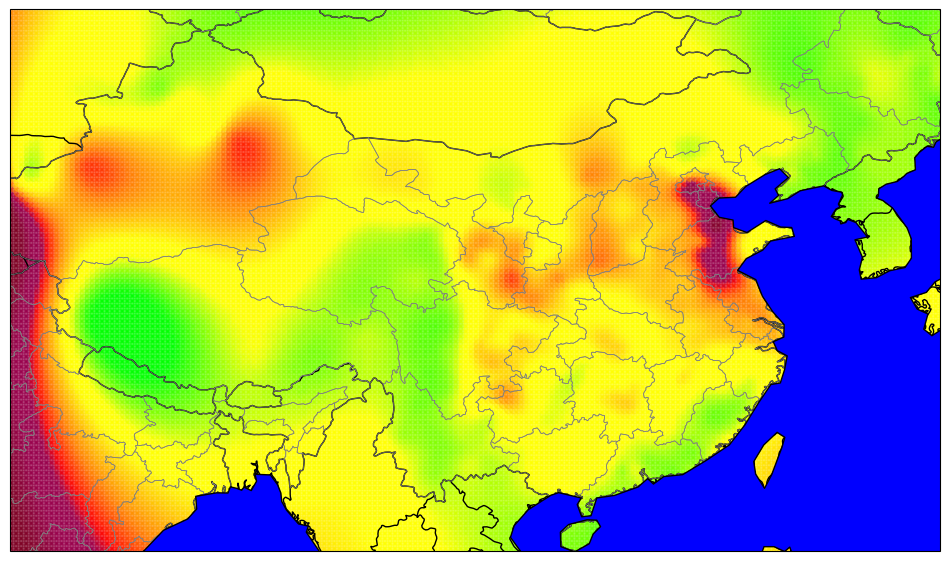

- #### steps = 0.2
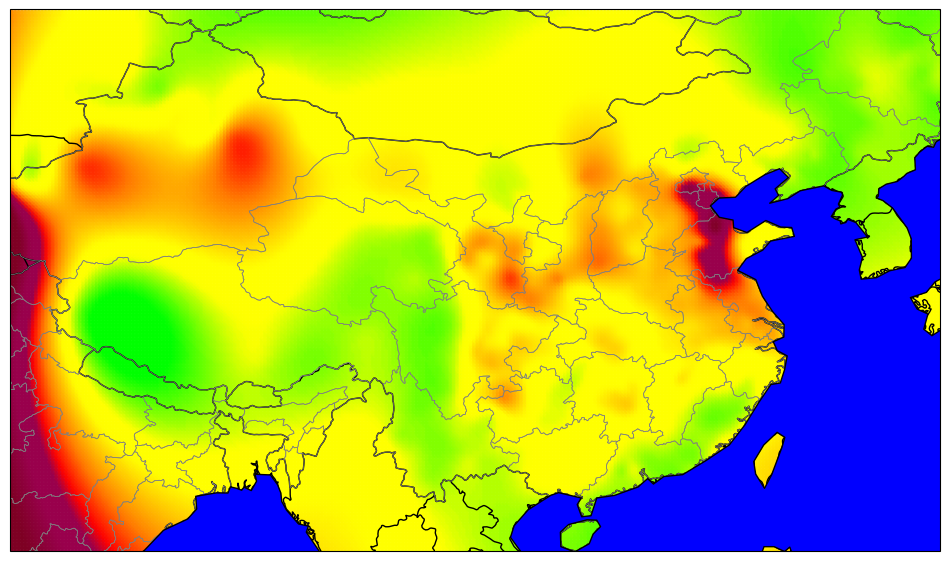

- #### steps = 0.1
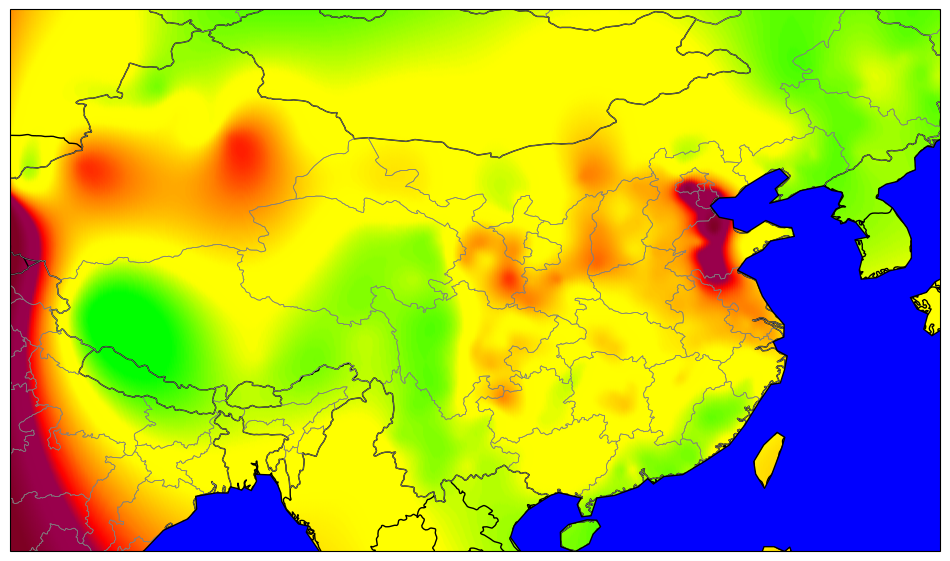

### Plot AQI image with Country and State Borders and Mask other countries out

In [188]:
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.feature import NaturalEarthFeature
from cartopy.io import shapereader
import geopandas
from shapely.geometry import Polygon


#### Find Geometry for China

In [195]:
# request data for use by geopandas
resolution = '10m'
category = 'cultural'
name = 'admin_0_countries'

shpfilename = shapereader.natural_earth(resolution, category, name)
df = geopandas.read_file(shpfilename)

# get geometry of a country
poly = [df.loc[df['ADMIN'] == 'China']['geometry'].values[0]]

In [196]:
def rect_from_bound(xmin, xmax, ymin, ymax):
    """Returns list of (x,y)'s for a rectangle"""
    xs = [xmax, xmin, xmin, xmax, xmax]
    ys = [ymax, ymax, ymin, ymin, ymax]
    return [(x, y) for x, y in zip(xs, ys)]

# Generate mask
pad1 = .1  #padding, degrees unit
exts = [poly[0].bounds[0] - pad1, poly[0].bounds[2] + pad1, poly[0].bounds[1] - pad1, poly[0].bounds[3] + pad1];

#convert geometry to mask
msk = Polygon(rect_from_bound(*exts)).difference( poly[0].simplify(0.01) )

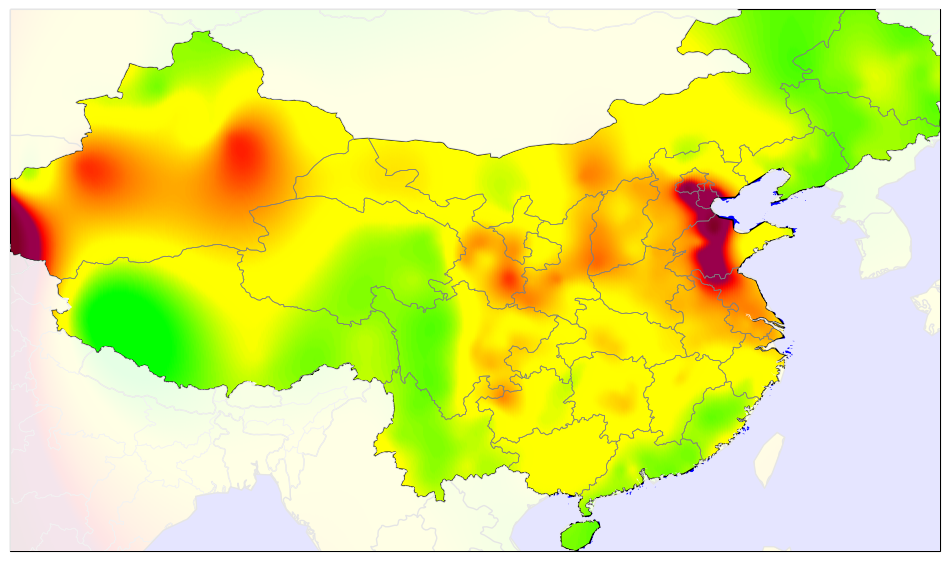

In [197]:

# Define the map projection
#proj = ccrs.Mercator()
proj = ccrs.PlateCarree()
# Plot the radar tile image
fig = plt.figure(figsize=(12, 12))
ax = fig.add_subplot(1, 1, 1, projection=proj)

# Plot the country borders
states_provinces = cfeature.NaturalEarthFeature(category='cultural', name='admin_1_states_provinces_lines',scale='50m', facecolor='none')
#cfeature.BORDERS
ax.add_feature(cfeature.BORDERS, linestyle='-', linewidth=1, edgecolor='black')
ax.add_feature(cfeature.COASTLINE,linestyle='-', edgecolor='black', linewidth=1)
ax.add_feature(cfeature.STATES,linestyle='-', edgecolor='gray', linewidth=0.5)

#ax.add_feature(cfeature.STATES, linestyle='-', linewidth=1, edgecolor='gray')
#ax.imshow(grid1, extent=(xmin, xmax, ymax, ymin), cmap=white_viridis, interpolation='gaussian')
#plt.scatter(xgs, ygs, c=zgs, cmap='rainbow',alpha=0.5,vmax=500, vmin=0)
#plt.scatter(xgs, ygs, c=zgs, cmap=white_viridis,alpha=0.5,vmax=600, vmin=0)
plt.scatter(xgs, ygs, c=zgs, cmap=china_aqi,alpha=0.5,vmax=500, vmin=0)

# Create a NaturalEarthFeature object for the ocean
ocean = NaturalEarthFeature('physical', 'ocean', '110m', edgecolor='black', facecolor='blue')
# Add the ocean to the map
ax.add_feature(ocean)

# Add countries to the map
#countries = NaturalEarthFeature(category='cultural', scale='10m', facecolor='none',  name='admin_0_countries')
#ax.add_feature(countries, edgecolor='black')

#add mask to highlight China
ax.add_geometries( msk, proj, zorder=12, facecolor='white', edgecolor='none', alpha=0.9)

# Create a mask to show only China
#china_mask = (countries.attributes['NAME'] == 'China')
#ax.add_feature(ocean)
# Set the x and y axis limits
ax.set_xlim(xmin,xmax) #[xmin,xmax]
ax.set_ylim( ymin,ymax) #[ymin, ymax]
plt.show()

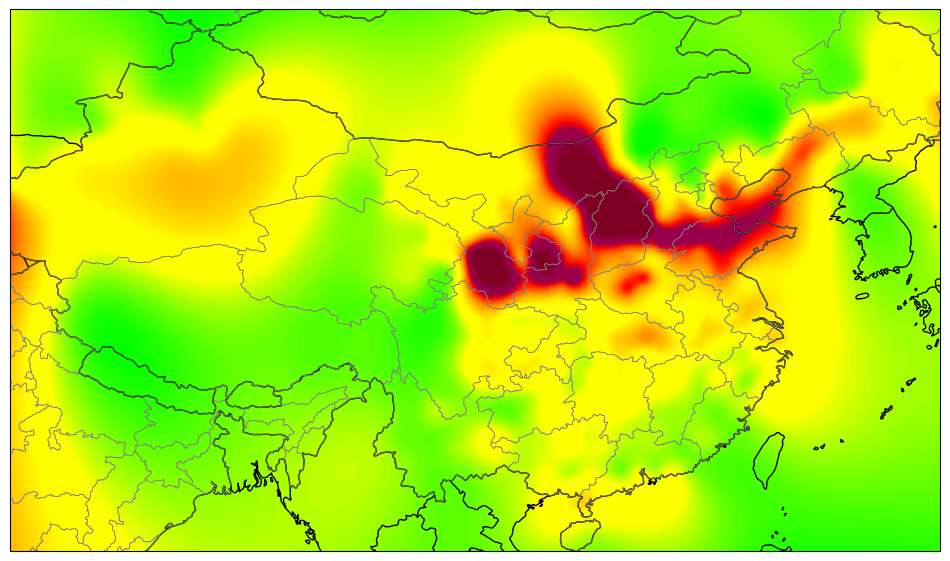

#camp = rainbow
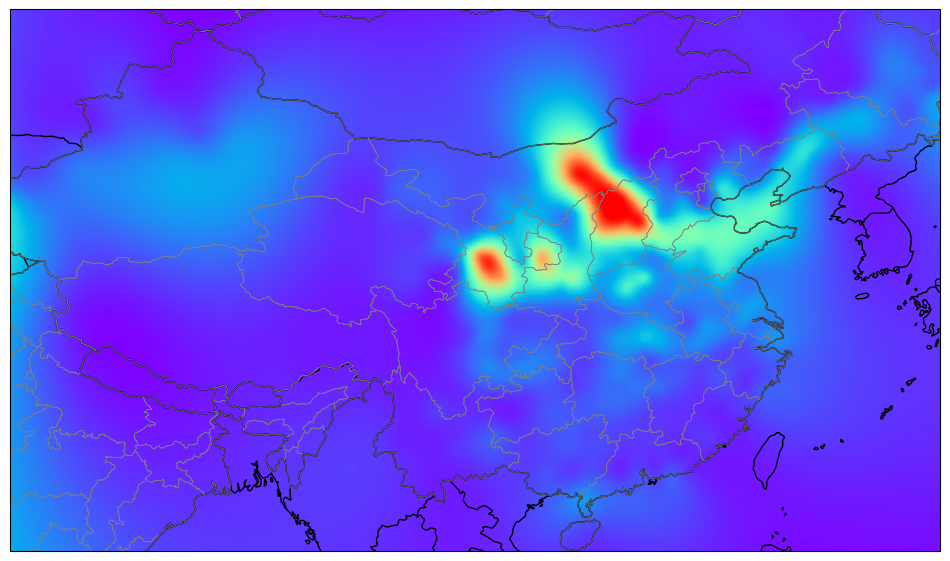

cmap=jet
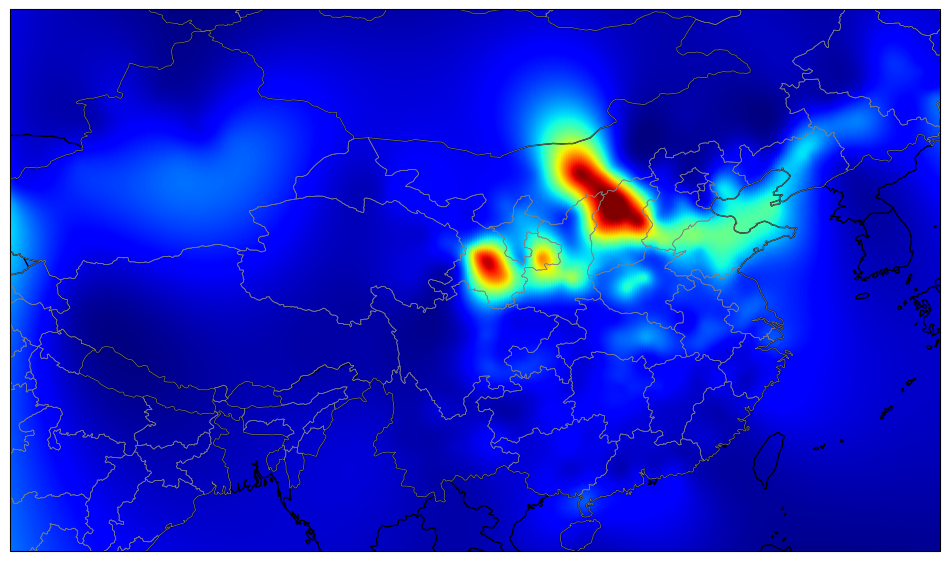

cmap = white_viridis
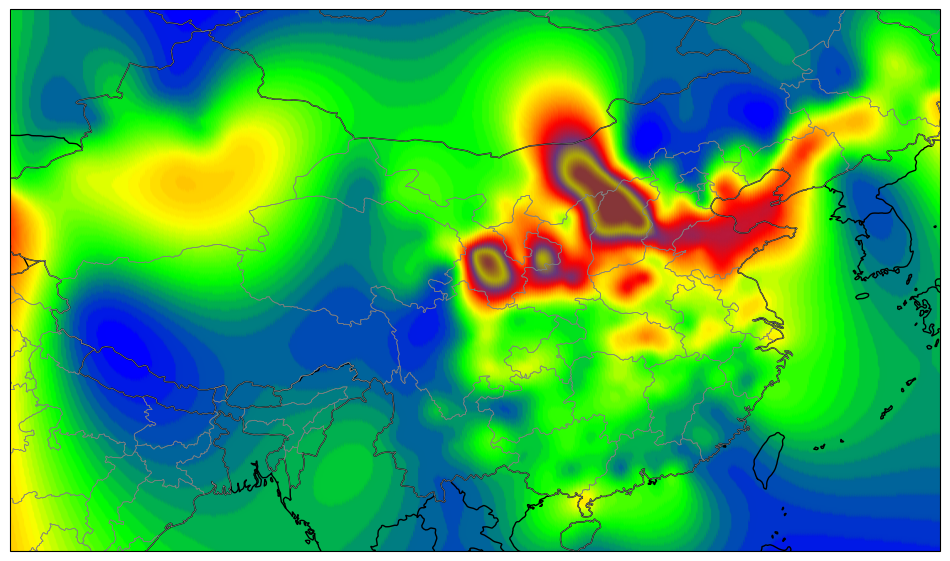

N=32
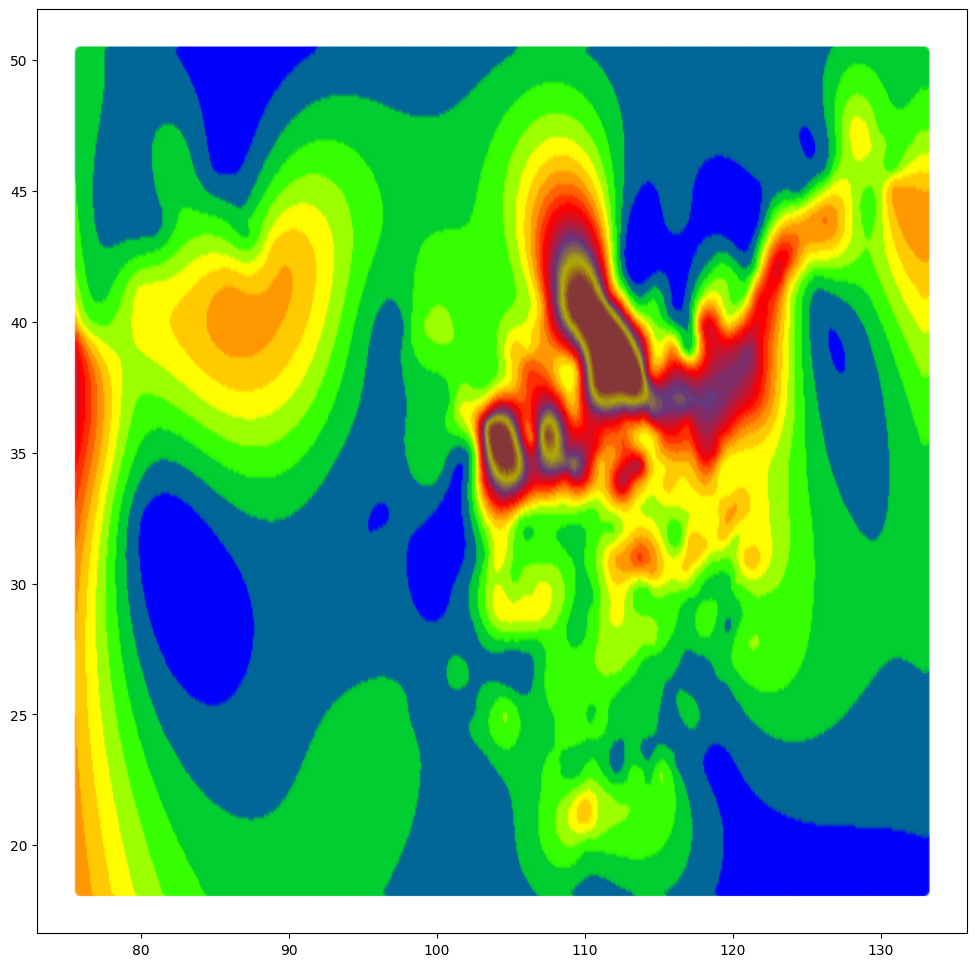

N=128
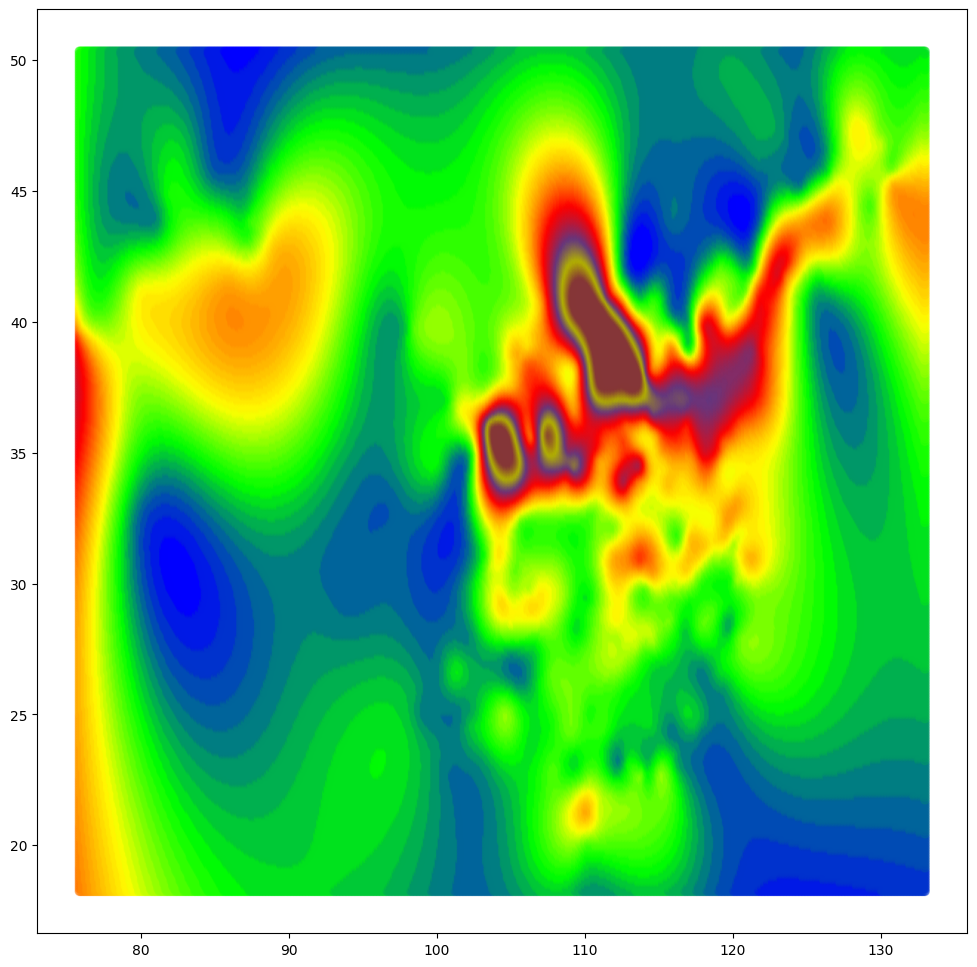

N=256
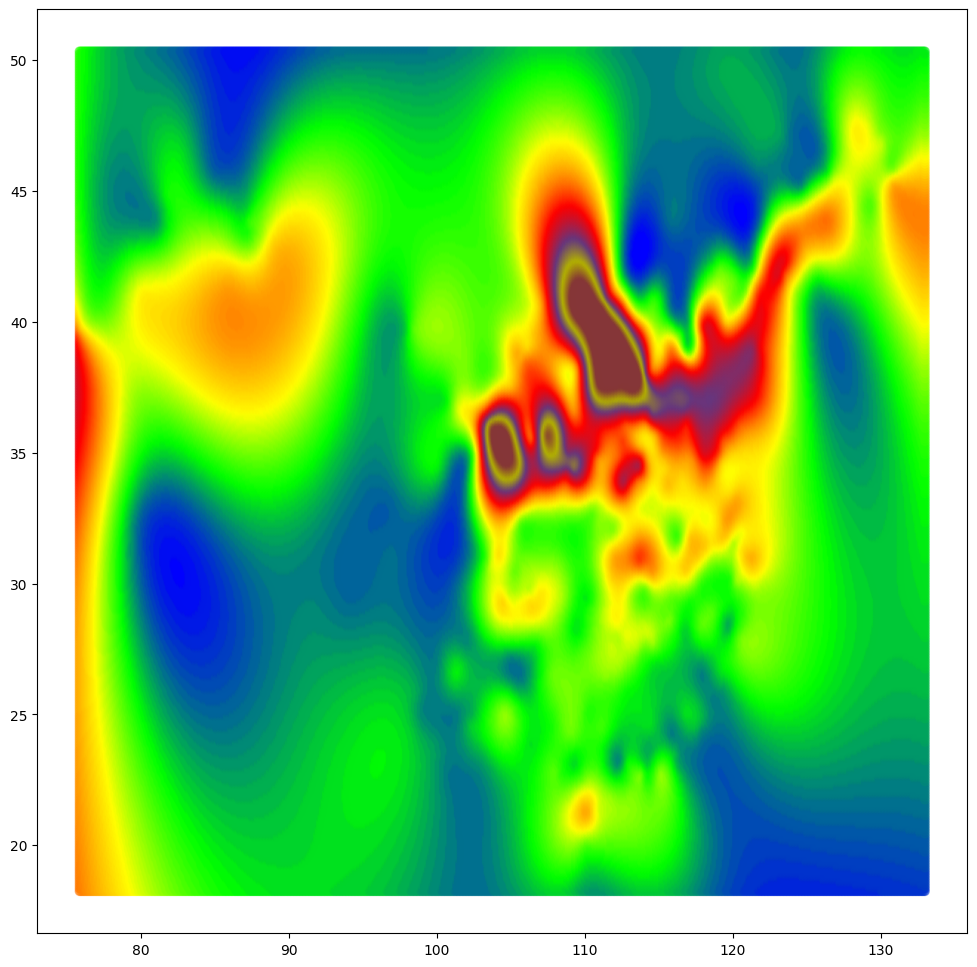

N=1024
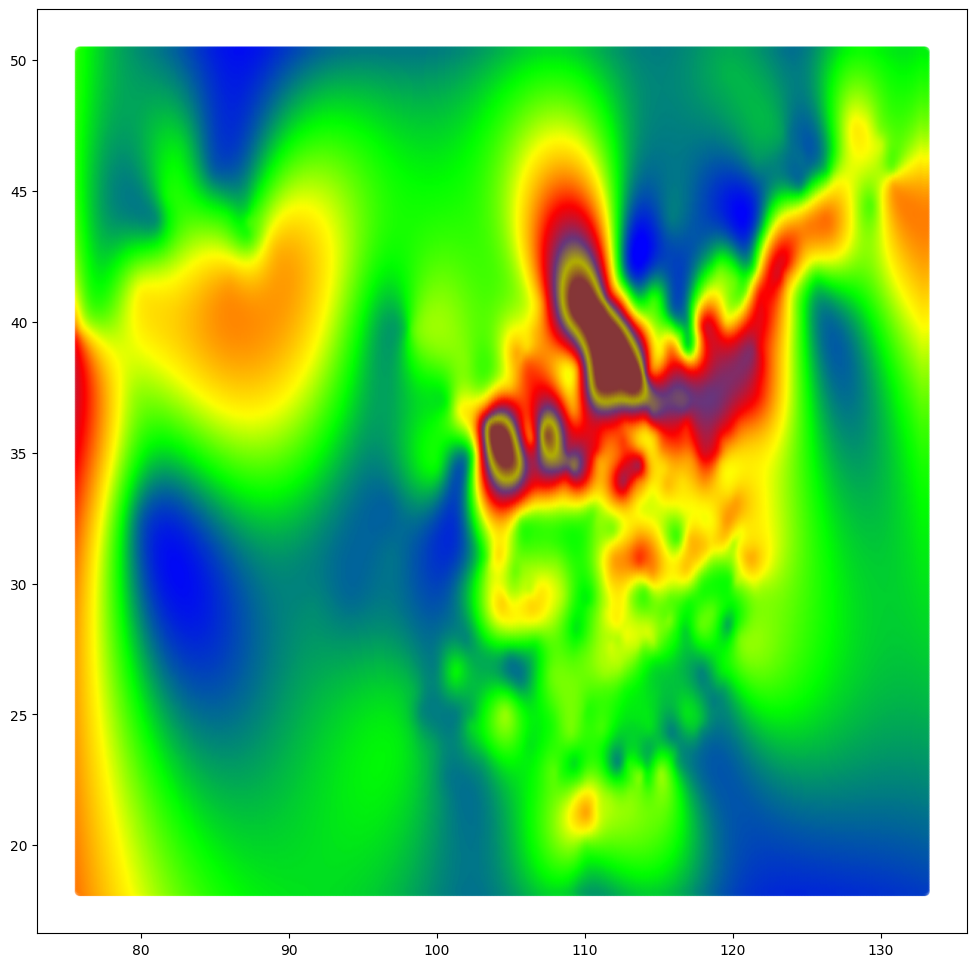

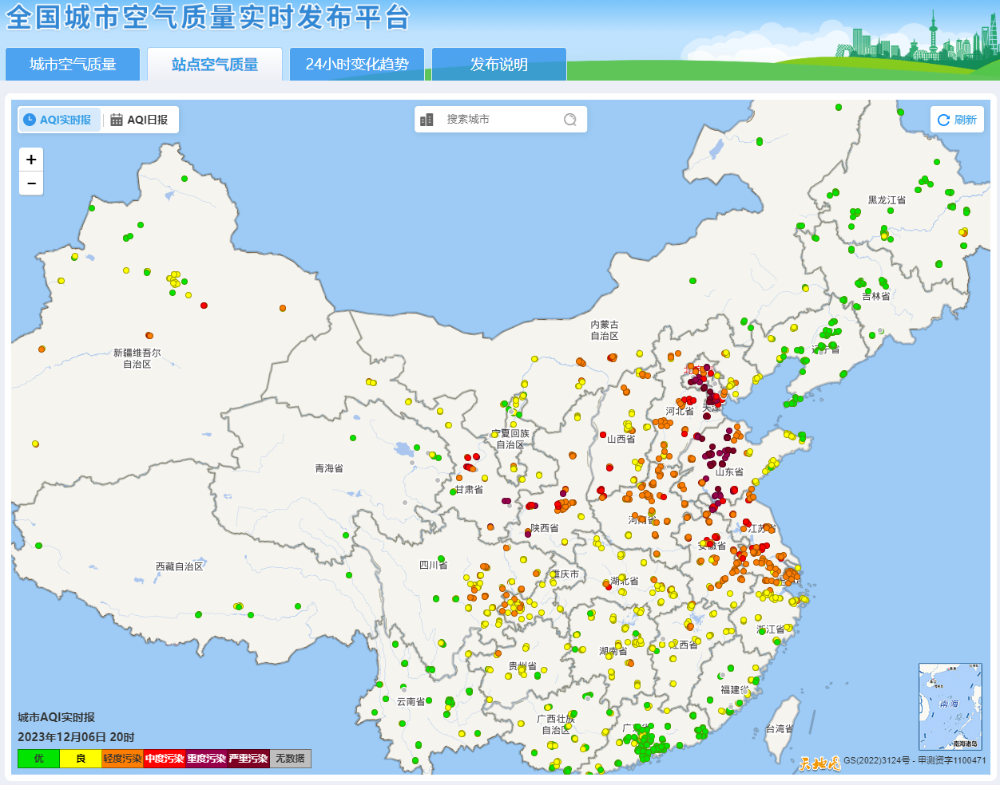

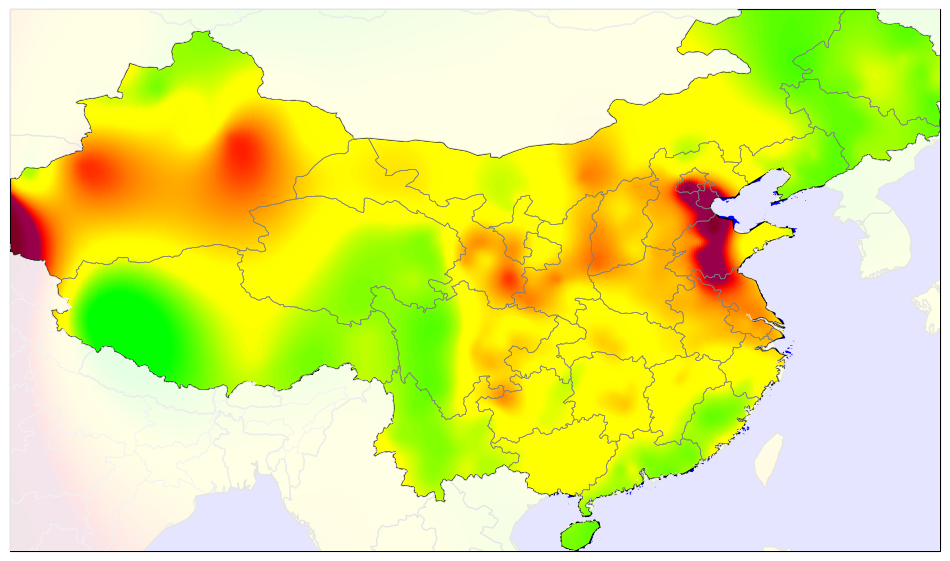

- aqi data
    https://www.zq12369.com/resource/js/echarts/echarts-map.js
    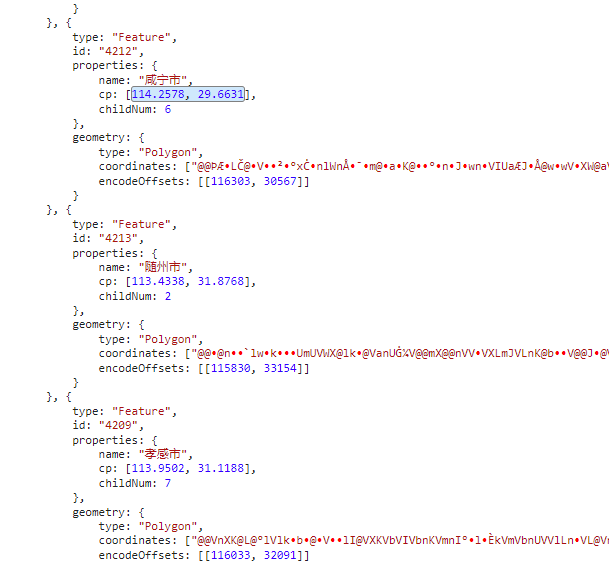